In [91]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, cross_validate, cross_val_score
from sklearn.pipeline import make_pipeline
from fast_ml.eda import df_info
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.ensemble import RandomForestClassifier
import tensorflow as tf
import keras 
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score, mean_absolute_error
from keras.callbacks import EarlyStopping
import joblib

def preprocess(df):
   
   '''preprocess your fifa dataframe'''

   df_dropped_func = pd.DataFrame()
   url = [idx for idx, col in enumerate(df.columns) if 'url' in col]
   url = [df.columns[idx] for idx in url]
   df = df.drop(columns= url, errors='ignore')

   df[['pace', 'shooting','passing','dribbling','defending','physic']] = df[['pace', 'shooting','passing','dribbling','defending','physic']].fillna(1)

   df['Penaltyist_Score'] = (0.4 * df['mentality_penalties'] + 0.4 * df['shooting'] + 0.1 * df['power_shot_power'] + 0.1 * df['mentality_vision']) / 4
   # df['player_role'] = df['player_positions'].apply(get_player_role)
   
   
   
   df['height_to_weight_ratio'] = df['height_cm'] / df['weight_kg']
   df_dropped_func.append(df[['height_cm', 'weight_kg']])
   
   df.drop(columns=['height_cm', 'weight_kg'],inplace=True, errors='ignore')
   
   df = df.dropna(subset=['wage_eur', 'value_eur'])
   df['value_to_wage_ratio'] = df.value_eur / df.wage_eur
   df_dropped_func.append(df[['value_eur', 'wage_eur']])
   df.drop(columns=['value_eur', 'wage_eur'], inplace=True, errors='ignore')
   
   columns_drop=['short_name', 'long_name', 'potential', 'dob', 'club_team_id', 'club_name',
       'league_name', 'league_level', 'club_loaned_from', 'club_joined','club_contract_valid_until', 'nationality_name',
       'nation_team_id', 'nation_jersey_number','international_reputation','release_clause_eur', 
       'player_tags', 'player_traits', 'nation_position','goalkeeping_speed','club_position']
  
   
   df_dropped_func = df[columns_drop]
   df = df.drop(columns=columns_drop, errors='ignore')
   
   df = df[df['club_jersey_number'].notnull()]

   df['attacking_ratio'] = (df.attacking_crossing + df.attacking_finishing 
                         + df.attacking_heading_accuracy + df.attacking_short_passing + df.attacking_volleys)/5
   df['main_ratio'] = (df.pace + df.shooting + df.passing + df.dribbling + df.defending + df.physic)/6
   df['skill_ratio'] = (df.skill_dribbling + df.skill_curve + df.skill_fk_accuracy + df.skill_long_passing + df.skill_ball_control) / 5
   df['movement_ratio'] = (df.movement_acceleration + df.movement_sprint_speed + df.movement_agility + df.movement_reactions + df.movement_balance)/5
   df['power_ratio'] = (df.power_jumping + df.power_shot_power + df.power_stamina + df.power_strength + df.power_long_shots) / 5
   df['mentality_ratio'] = (df.mentality_aggression + df.mentality_interceptions + 
                         df.mentality_positioning + df.mentality_vision + df.mentality_penalties + df.mentality_composure) / 6
   df['defending_ratio'] = (
      df.defending_marking_awareness + df.defending_standing_tackle + df.defending_sliding_tackle
      ) / 3
   df['gk_ratio'] = (
      df.goalkeeping_diving + df.goalkeeping_handling + df.goalkeeping_kicking + df.goalkeeping_positioning + df.goalkeeping_reflexes
      ) / 5
   df['attack_to_defense_ratio'] = (df.attacking_ratio / df.defending_ratio)
   df['skill_to_movement_ratio'] = (df.skill_ratio / df.movement_ratio)
   
   df['attack_to_movement_ratio'] = (df.attacking_ratio / df.movement_ratio)
   df['power_to_defence_ratio'] = (df.power_ratio/ df.defending_ratio)
   df['skill_to_defence_ratio'] = (df.skill_ratio / df.defending_ratio)
   df['attack_to_gk_ratio'] = (df.attacking_ratio / df.gk_ratio)
   
   for col in df.columns:
    if df[col].dtype == 'object':
        df[col] = df[col].astype(float, errors = 'ignore')
   
   return df

def EDA(df):
    total_na = df.isna().sum().sum()
    print('Dimensions:', df.shape[0], ' - rows', df.shape[1], ' - columns')
    print('Total NA\'s', total_na)
    print("%38s %10s     %10s %10s" % ("Column Name", "Data Type", "Count Distinct", "NA Values"))
    col_name = df.columns
    dtypes = df.dtypes
    uniq = df.nunique()
    na_val = df.isna().sum()
    for i in range(len(df.columns)):
        print("%38s %10s     %10s %10s" % (col_name[i], dtypes[i], uniq[i], na_val[i]))

def get_player_role(positions):
    if 'ST' in positions or 'CF' in positions:
        return 'Attack Player'
    elif 'CAM' in positions or 'LW' in positions or 'RW' in positions or 'RM' in positions or 'CM' in positions or 'LM' in positions:
        return 'Midfielder'
    elif 'RWB' in positions or 'CDM' in positions or 'LWB' in positions or 'LB' in positions or 'CB' in positions or 'RB' in positions:
        return 'Defender'
    elif 'GK' in positions:
        return 'Goalkeeper'
    else:
        return 'Unknown'

def oversample(X, Y):
    sm = SMOTE()
    X_resempled, Y_resempled = sm.fit_resample(X, Y)
    return X_resempled, Y_resempled



In [2]:
df_check = pd.read_csv('fifa23_players.csv')
df_check = preprocess(df_check)

/var/folders/yq/sbcn4y5n0zl14q1_s6x_1sbr0000gn/T/ipykernel_70808/398381505.py:1: DtypeWarning: Columns (24,78) have mixed types. Specify dtype option on import or set low_memory=False.
  df_check = pd.read_csv('fifa23_players.csv')
/var/folders/yq/sbcn4y5n0zl14q1_s6x_1sbr0000gn/T/ipykernel_70808/3480512080.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_dropped_func.append(df[['height_cm', 'weight_kg']])
/var/folders/yq/sbcn4y5n0zl14q1_s6x_1sbr0000gn/T/ipykernel_70808/3480512080.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_dropped_func.append(df[['value_eur', 'wage_eur']])


In [3]:
EDA(df_check)

Dimensions: 19165  - rows 67  - columns
Total NA's 0
                           Column Name  Data Type     Count Distinct  NA Values
                             sofifa_id      int64          19165          0
                      player_positions     object            674          0
                               overall      int64             47          0
                                   age      int64             28          0
                    club_jersey_number    float64             99          0
                        preferred_foot     object              2          0
                             weak_foot      int64              5          0
                           skill_moves      int64              5          0
                             work_rate     object              9          0
                             body_type     object             10          0
                                  pace    float64             71          0
                              s

In [4]:
duplicates_df = pd.DataFrame(columns=df_check.columns)  
for index, row in df_check.iterrows():
    positions = row['player_positions'].split(',')  
    for position in positions:
        duplicate = row.copy()
        duplicate['player_positions'] = position.strip()
        duplicates_df = duplicates_df.append(duplicate)

df_check = duplicates_df

/var/folders/yq/sbcn4y5n0zl14q1_s6x_1sbr0000gn/T/ipykernel_70808/4003932410.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates_df = duplicates_df.append(duplicate)
/var/folders/yq/sbcn4y5n0zl14q1_s6x_1sbr0000gn/T/ipykernel_70808/4003932410.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates_df = duplicates_df.append(duplicate)
/var/folders/yq/sbcn4y5n0zl14q1_s6x_1sbr0000gn/T/ipykernel_70808/4003932410.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  duplicates_df = duplicates_df.append(duplicate)
/var/folders/yq/sbcn4y5n0zl14q1_s6x_1sbr0000gn/T/ipykernel_70808/4003932410.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat

In [5]:
del index, row, position, positions, duplicates_df, duplicate

In [6]:
df_save = df_check

In [7]:
encoder_target = LabelEncoder()
df_check.player_positions = encoder_target.fit_transform(df_check.player_positions)

In [8]:
EDA(df_check)

Dimensions: 31825  - rows 67  - columns
Total NA's 0
                           Column Name  Data Type     Count Distinct  NA Values
                             sofifa_id     object          19165          0
                      player_positions      int64             15          0
                               overall     object             47          0
                                   age     object             28          0
                    club_jersey_number    float64             99          0
                        preferred_foot     object              2          0
                             weak_foot     object              5          0
                           skill_moves     object              5          0
                             work_rate     object              9          0
                             body_type     object             10          0
                                  pace    float64             71          0
                              s

In [9]:
df_check = df_check.astype(float, errors='ignore')

In [10]:
encoder = LabelEncoder()
categorical = df_check.select_dtypes(include='object').columns

df_check[categorical] = df_check[categorical].apply(encoder.fit_transform)


In [11]:
X = df_check.drop(columns='player_positions')
Y = df_check.player_positions

X_RES, Y_RES = oversample(X, Y)
# Оверсемплінг для усіх даних. Я памʼятаю на лекції Ви казали, що краще робити оверсемлпніг 
# тільки для трейн датасету, але, оскільки SMOTE не праюцює для мультитаргету, то мені потрбіно було створити дублікати гравців
# з різними позиціями, які у них були розділені через кому. 
# Чому дублікати? Тому що деякі гравці мають унікальні комбінації позицій, які представлені тільки в одному або двох екземплярах, 
# і тому SMOTE просто не може створити їх. Тому я семплю дані і потім усе повертаю на свої місця, звісно деякі засмплені дані втратяться, але ми 
# нагенеруємо 20000 нових записів і тим самим трохи збаланасуємо класи. 
# Якщо є певний спосіб зробити тільки для трейн сету семплінг, то я був би вдячний зп посилання на статтю, бо я не знайшов)



<Axes: xlabel='player_positions', ylabel='Count'>

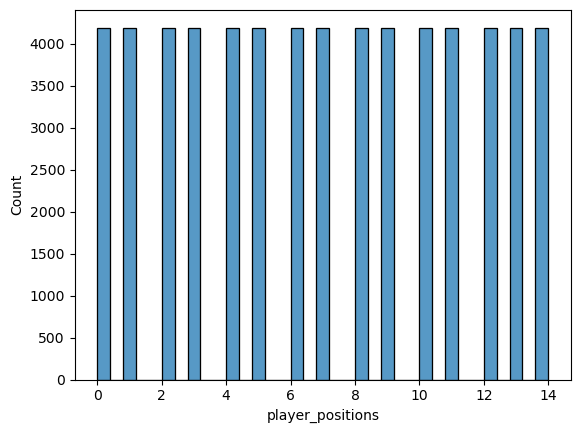

In [12]:
sns.histplot(Y_RES)

In [13]:
df_check = pd.concat([X_RES, Y_RES], axis=1)

In [14]:
df_save_2 = df_check

In [15]:
df_check.player_positions = df_check.player_positions.astype(int)

In [16]:
df_check.player_positions = encoder_target.inverse_transform(df_check.player_positions)

In [17]:
df_save_3 = df_check

In [18]:
# Групуємо дані за гравцями та об'єднуємо значення поля player_positions через кому
df_grouped = df_check.groupby('sofifa_id')['player_positions'].apply(', '.join).reset_index()

# Об'єднуємо згруповані дані з оригінальним фреймом за допомогою злиття
df_merged = pd.merge(df_check.drop(columns='player_positions'), df_grouped, on='sofifa_id')

# Видаляємо дублікати гравців, залишаючи тільки перший запис. Перевірка по айді гравця
df_final = df_merged.drop_duplicates(subset='sofifa_id')

# Скидуємо індекси рядків
df_check = df_final.reset_index(drop=True)


In [19]:
# Розділення позицій і застосування one-hot encoding
positions = df_check['player_positions'].str.split(', ')
one_hot = pd.get_dummies(positions.apply(pd.Series).stack()).sum(level=0)

# Об'єднання one-hot encoded даних з вихідним DataFrame
df_encoded = pd.concat([df_check, one_hot], axis=1)

/var/folders/yq/sbcn4y5n0zl14q1_s6x_1sbr0000gn/T/ipykernel_70808/1278408984.py:3: FutureWarning: Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().
  one_hot = pd.get_dummies(positions.apply(pd.Series).stack()).sum(level=0)


In [20]:
del categorical, one_hot, positions, encoder_target, df_save, df_save_2, df_save_3, df_merged, df_grouped, df_final

In [21]:
df_encoded.drop(columns=['sofifa_id', 'player_positions'], inplace=True, errors='ignore')

In [22]:
columns = df_encoded.columns[-15:]
X = df_encoded.drop(columns=columns)
Y = df_encoded.iloc[:, -15:]

X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, train_size=0.8, random_state=0)
X_valid, X_test, Y_valid, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=0)


In [22]:
forest_model = RandomForestClassifier(n_estimators=800)

cross_val_score(forest_model, X_train, Y_train, scoring='accuracy', cv=3)

/Users/home/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:794: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/home/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 115, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "/Users/home/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/Users/home/anaconda3/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/Users/home/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py", line 221, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "/Users/home/anaconda3/lib/python3.10/site-packages/

KeyboardInterrupt: 

In [24]:
forest_model = RandomForestClassifier(n_estimators=800)

forest_model.fit(X_train, Y_train)
predictions = forest_model.predict(X_valid)

print('Accuracy score: ', accuracy_score(Y_valid, predictions))

Accuracy score:  0.4563745019920319


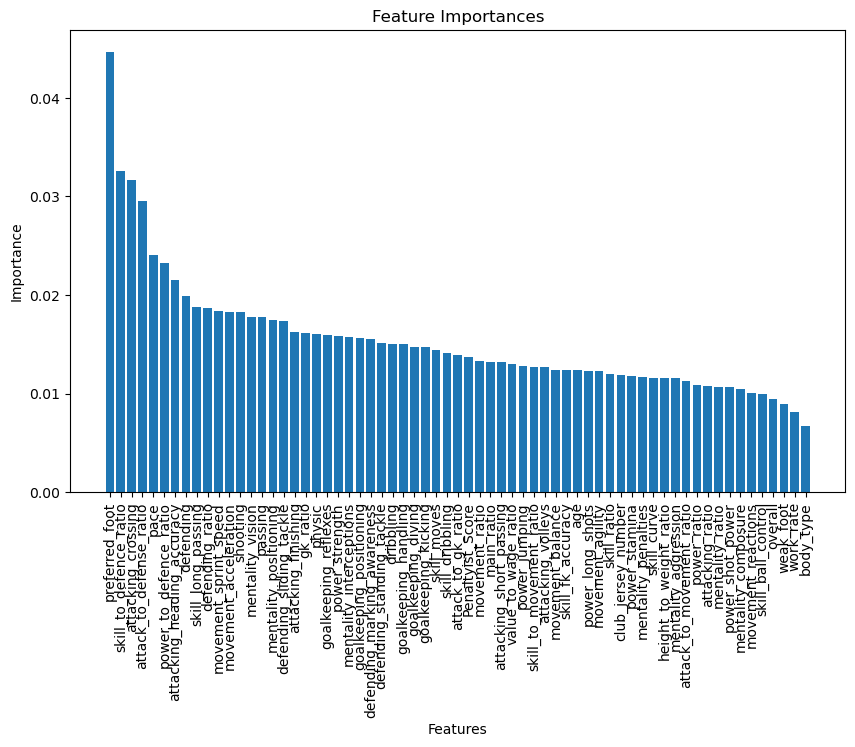

In [25]:
importances = forest_model.feature_importances_

# Sort features in descending order of importance
sorted_indices = np.argsort(importances)[::-1]
sorted_features = X_train.columns[sorted_indices]

# Create a bar plot of feature importances
plt.figure(figsize=(10, 6))
plt.bar(sorted_features, importances[sorted_indices])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()


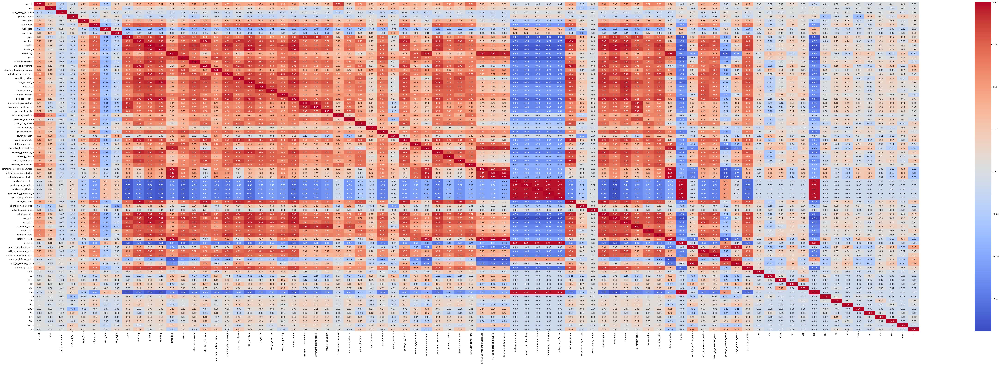

In [23]:
corr = df_encoded.corr()

plt.figure(figsize=(100, 30))  
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm")
plt.show()

In [23]:
scaler = StandardScaler()
x_columns = df_encoded.iloc[: , :-15].columns
X = scaler.fit_transform(X)


In [41]:
X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, train_size=0.8, random_state=0)
X_valid, X_test, Y_valid, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=0)

forest_model = RandomForestClassifier(n_estimators=800)

forest_model.fit(X_train, Y_train)
predictions = forest_model.predict(X_valid)

print('Accuracy score: ', accuracy_score(Y_valid, predictions))

ValueError: Unknown label type: 'continuous-multioutput'

In [24]:
len(df_encoded.columns)

80

In [25]:
neural = tf.keras.Sequential()
stop = EarlyStopping()
input  = tf.keras.layers.Dense(65, input_shape = [65], activation='elu')
neural.add(input)

h1 = tf.keras.layers.Dense(130, activation='relu')
neural.add(h1)

h2 = tf.keras.layers.Dense(390, activation='relu')
neural.add(h2)
h3 = tf.keras.layers.Dense(1170, activation='relu')
neural.add(h3)
out = tf.keras.layers.Dense(15, activation='softmax')
neural.add(out)

neural.compile(optimizer= 'adam', loss='binary_crossentropy', metrics=['accuracy'])
history = neural.fit(X_train, Y_train, batch_size=300, validation_split=0.2, epochs=1500, steps_per_epoch=220, callbacks=[stop], workers=20)

Epoch 1/1500
220/220 [==============================] - 2s 6ms/step - loss: 0.3692 - accuracy: 0.3528 - val_loss: 0.1921 - val_accuracy: 0.3997
Epoch 2/1500
220/220 [==============================] - 1s 6ms/step - loss: 0.1819 - accuracy: 0.4314 - val_loss: 0.1816 - val_accuracy: 0.4266
Epoch 3/1500
220/220 [==============================] - 1s 6ms/step - loss: 0.1749 - accuracy: 0.4525 - val_loss: 0.1725 - val_accuracy: 0.4519
Epoch 4/1500
220/220 [==============================] - 1s 6ms/step - loss: 0.1697 - accuracy: 0.4728 - val_loss: 0.1684 - val_accuracy: 0.4818
Epoch 5/1500
220/220 [==============================] - 1s 6ms/step - loss: 0.1653 - accuracy: 0.4888 - val_loss: 0.1645 - val_accuracy: 0.4930
Epoch 6/1500
220/220 [==============================] - 1s 6ms/step - loss: 0.1602 - accuracy: 0.5106 - val_loss: 0.1586 - val_accuracy: 0.5179
Epoch 7/1500
220/220 [==============================] - 1s 6ms/step - loss: 0.1580 - accuracy: 0.5203 - val_loss: 0.1568 - val_accuracy:

In [26]:
df_save_one = df_encoded

In [27]:
df_encoded = df_save_one

In [28]:
df_encoded.columns

Index(['overall', 'age', 'club_jersey_number', 'preferred_foot', 'weak_foot',
       'skill_moves', 'work_rate', 'body_type', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle',
       'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking'

In [89]:
df_check = df_encoded[['overall', 'age', 'club_jersey_number', 'preferred_foot', 'weak_foot',
       'skill_moves', 'work_rate', 'body_type', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle',
       'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes', 'Penaltyist_Score',
       'height_to_weight_ratio', 'value_to_wage_ratio', 'attacking_ratio',
       'main_ratio', 'skill_ratio', 'movement_ratio', 'power_ratio',
       'mentality_ratio', 'defending_ratio', 'gk_ratio',
       'attack_to_defense_ratio', 'skill_to_movement_ratio',
       'attack_to_movement_ratio', 'power_to_defence_ratio',
       'skill_to_defence_ratio', 'attack_to_gk_ratio', 'CAM', 'CB', 'CDM',
       'CF', 'CM', 'GK', 'LB', 'LM', 'LW', 'LWB', 'RB', 'RM', 'RW', 'RWB',
       'ST']]
columns = df_check.columns[-15:]
X = df_check.drop(columns=columns)
Y = df_check.iloc[:, -15:]
scaler = StandardScaler()

x_columns = df_check.iloc[: , :-15].columns
X = scaler.fit_transform(X)

X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, train_size=0.8, random_state=0)
X_valid, X_test, Y_valid, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=0)

k_neurons = len(df_check.columns[:-15])
neural = tf.keras.Sequential()
stop = EarlyStopping()
input  = tf.keras.layers.Dense(k_neurons, input_shape = [k_neurons], activation='elu')
neural.add(input)

h1 = tf.keras.layers.Dense(k_neurons*4, activation='tanh')
neural.add(h1)

h2 = tf.keras.layers.Dense(k_neurons*8, activation='tanh')
neural.add(h2)
h3 = tf.keras.layers.Dense(k_neurons*16, activation='tanh')
neural.add(h3)
h4 = tf.keras.layers.Dense(k_neurons*32, activation='tanh')
neural.add(h4)
# h5 = tf.keras.layers.Dense(k_neurons*64, activation='tanh')
# neural.add(h5)
out = tf.keras.layers.Dense(15, activation='softmax')
neural.add(out)

neural.compile(optimizer= 'adam', loss='binary_crossentropy', metrics=['accuracy'])
history = neural.fit(X_train, Y_train, batch_size=300, epochs=100, validation_split=0.2, steps_per_epoch=300,callbacks=[stop])

Epoch 1/100
300/300 [==============================] - 7s 22ms/step - loss: 0.1714 - accuracy: 0.4884 - val_loss: 0.1536 - val_accuracy: 0.5182
Epoch 2/100
300/300 [==============================] - 7s 22ms/step - loss: 0.1545 - accuracy: 0.5225 - val_loss: 0.1492 - val_accuracy: 0.5404
Epoch 3/100
300/300 [==============================] - 7s 23ms/step - loss: 0.1478 - accuracy: 0.5483 - val_loss: 0.1456 - val_accuracy: 0.5598
Epoch 4/100
300/300 [==============================] - 7s 23ms/step - loss: 0.1397 - accuracy: 0.5799 - val_loss: 0.1415 - val_accuracy: 0.5814
Epoch 5/100
300/300 [==============================] - 7s 23ms/step - loss: 0.1253 - accuracy: 0.6342 - val_loss: 0.1331 - val_accuracy: 0.6173
Epoch 6/100
300/300 [==============================] - 7s 23ms/step - loss: 0.1081 - accuracy: 0.6904 - val_loss: 0.1272 - val_accuracy: 0.6485
Epoch 7/100
300/300 [==============================] - 7s 23ms/step - loss: 0.0899 - accuracy: 0.7468 - val_loss: 0.1237 - val_accuracy:

In [90]:
loss, accuracy = neural.evaluate(X_valid, Y_valid)
print('Test score', loss)
print('Test accuracy', accuracy)
loss, accuracy = neural.evaluate(X_test, Y_test)
print('Test score', loss)
print('Test accuracy', accuracy)

157/157 [==============================] - 0s 2ms/step - loss: 0.1235 - accuracy: 0.6920
Test score 0.12349488586187363
Test accuracy 0.6920318603515625
157/157 [==============================] - 0s 2ms/step - loss: 0.1298 - accuracy: 0.6762
Test score 0.12979616224765778
Test accuracy 0.6761601567268372


In [52]:
columns = df_check.columns[-15:]
X = df_check.drop(columns=columns)
Y = df_check.iloc[:, -15:]

X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, train_size=0.8, random_state=0)
X_valid, X_test, Y_valid, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=0)
forest_model = RandomForestClassifier(n_estimators=800)

forest_model.fit(X_train, Y_train)
predictions = forest_model.predict(X_valid)

print('Accuracy score: ', accuracy_score(Y_valid, predictions))
predictions = forest_model.predict(X_test)

print('Accuracy score: ', accuracy_score(Y_test, predictions))

Accuracy score:  0.4651394422310757
Accuracy score:  0.4487153953395738


In [37]:
df_check.columns[:-15]

Index(['pace', 'age', 'shooting', 'preferred_foot', 'passing', 'dribbling',
       'defending', 'physic', 'gk_ratio', 'attack_to_defense_ratio',
       'attacking_crossing', 'defending_marking_awareness',
       'defending_sliding_tackle'],
      dtype='object')

In [179]:
# df_encoded.drop(columns=['body_type', 'work_rate', 'weak_foot',
# 'overall', 'mentality_ratio','movement_reactions', 'skill_ball_control', 'mentality_composure', 'power_shot_power', 
# 'power_ratio', 'mentality_aggression', 'skill_curve', 'power_stamina', 'club_jersey_number', 'movement_agility', 
# 'mentality_penalties', 'age', 'movement_balance', 'power_jumping', 'value_to_wage_ration', 'skill_fk_accuracy', 
# 'power_long_shots', 'attacking_volleys', 'skill_moves', 'skill_dribbling', 'attacking_short_passing', 'shooting', 
# 'movement_acceleration', 'movement_sprint_speed', 'mentality_interceptions', 'mentality_positioning', 'defending_marking_awareness', 
# 'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning'],
                #    inplace=True, errors = 'ignore')
# df_encoded.drop(columns=['passing', 'dribbling', 'physic', 'skill_long_passing', 'mentality_vision', 'value_to_wage_ratio', 'goalkeeping_diving',
#                          'goalkeeping_reflexes', 'gk_ratio', 'defending', 'attacking_finishing', 'height_to_weight_ratio', 'main_ratio',
#                          'attack_to_gk_ratio', 'pace', 'Penaltyist_Score', 'skill_ratio', 'attacking_crossing', 'overall',
#                          'shooting', 'skill_dribbling', 'goalkeeping_positioning', 'skill_moves', 'goalkeeping_kicking',
#                          'attacking_short_passing','skill_curve', 'skill_ball_control'], inplace=True, errors='ignore')
df_encoded.drop(columns=['overall', 'pace', 'physic', 'height_to_weight_ratio', 'shooting','skill_ball_control',
                         'value_to_wage_ratio', 'skill_long_passing', 'goalkeeping_positioning', 'goalkeeping_kicking',
                         'goalkeeping_handling', 'skill_dribbling', 'age','defending_sliding_tackle','skill_ratio', 'main_ratio',
                         'defending_standing_tackle','attacking_ratio','skill_to_defence_ratio',
                         'movement_ratio'], inplace=True, errors='ignore')

In [180]:
scaler = StandardScaler()
columns = df_encoded.columns[:-15]
X = df_encoded[columns]
X = scaler.fit_transform(X)

X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, train_size=0.8, random_state=0)
X_valid, X_test, Y_valid, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=0)

forest_model = RandomForestClassifier(n_estimators=800)

# forest_model.fit(X_train, Y_train)
# predictions = forest_model.predict(X_valid)

# print('Accuracy score: ', accuracy_score(Y_valid, predictions))

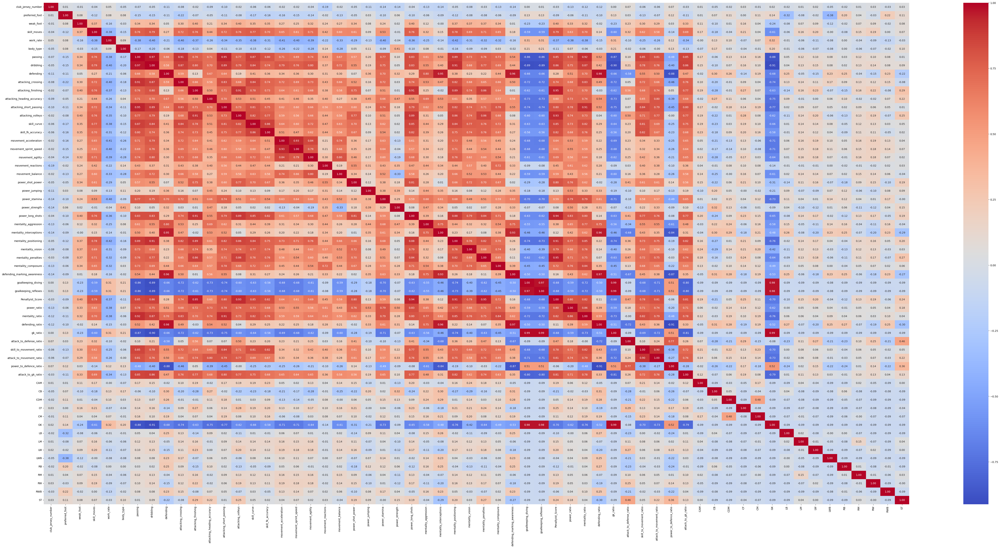

In [181]:
corr = df_encoded.corr()

plt.figure(figsize=(75, 35))  
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm")
plt.show()

In [182]:
k_neurons = 45

In [202]:
neural = tf.keras.Sequential()
stop = EarlyStopping()
input  = tf.keras.layers.Dense(k_neurons, input_shape = [k_neurons], activation='elu')
neural.add(input)

h1 = tf.keras.layers.Dense(k_neurons*2, activation='tanh')
neural.add(h1)
h2 = tf.keras.layers.Dense((k_neurons*2)*2, activation='tanh')
neural.add(h2)
h3 = tf.keras.layers.Dense((k_neurons*2)*4, activation='tanh')
neural.add(h3)
h4 = tf.keras.layers.Dense((k_neurons*2)*8, activation='tanh')
neural.add(h4)
h5 = tf.keras.layers.Dense((k_neurons*2)*16, activation='tanh')
neural.add(h5)
# h6 = tf.keras.layers.Dense((k_neurons*2)*8, activation='tanh')
# neural.add(h6)
# h7 = tf.keras.layers.Dense((k_neurons*2)*4, activation='tanh')
# neural.add(h7)
# h8 = tf.keras.layers.Dense((k_neurons*2)*2, activation='tanh')
# neural.add(h8)
# h9 = tf.keras.layers.Dense(k_neurons*2, activation='tanh')
# neural.add(h9)

out = tf.keras.layers.Dense(15, activation='softmax')
neural.add(out)

neural.compile(optimizer= 'adam', loss='binary_crossentropy', metrics=['accuracy'])
history = neural.fit(X_train, Y_train, batch_size=250, validation_split=0.2, epochs=100, steps_per_epoch=300, callbacks=[stop])

Epoch 1/100
300/300 [==============================] - 5s 16ms/step - loss: 0.1716 - accuracy: 0.4819 - val_loss: 0.1554 - val_accuracy: 0.5067
Epoch 2/100
300/300 [==============================] - 5s 17ms/step - loss: 0.1552 - accuracy: 0.5170 - val_loss: 0.1526 - val_accuracy: 0.5283
Epoch 3/100
300/300 [==============================] - 5s 17ms/step - loss: 0.1512 - accuracy: 0.5331 - val_loss: 0.1517 - val_accuracy: 0.5220
Epoch 4/100
300/300 [==============================] - 5s 16ms/step - loss: 0.1459 - accuracy: 0.5548 - val_loss: 0.1458 - val_accuracy: 0.5556
Epoch 5/100
300/300 [==============================] - 5s 17ms/step - loss: 0.1401 - accuracy: 0.5782 - val_loss: 0.1425 - val_accuracy: 0.5791
Epoch 6/100
300/300 [==============================] - 5s 16ms/step - loss: 0.1316 - accuracy: 0.6116 - val_loss: 0.1393 - val_accuracy: 0.5912
Epoch 7/100
300/300 [==============================] - 5s 16ms/step - loss: 0.1191 - accuracy: 0.6569 - val_loss: 0.1328 - val_accuracy:

In [213]:
loss, accuracy = neural.evaluate(X_valid, Y_valid)
print('Test score', loss)
print('Test accuracy', accuracy)
loss, accuracy = neural.evaluate(X_test, Y_test)
print('Test score', loss)
print('Test accuracy', accuracy)

157/157 [==============================] - 0s 2ms/step - loss: 0.1355 - accuracy: 0.6538
Test score 0.13549333810806274
Test accuracy 0.6537848711013794
157/157 [==============================] - 0s 2ms/step - loss: 0.1389 - accuracy: 0.6499
Test score 0.13887561857700348
Test accuracy 0.6498705148696899


In [187]:
neural = tf.keras.Sequential()
stop = EarlyStopping()
input  = tf.keras.layers.Dense(k_neurons, input_shape = [k_neurons], activation='elu')
neural.add(input)

h1 = tf.keras.layers.Dense(k_neurons, activation='tanh')
neural.add(h1)

h2 = tf.keras.layers.Dense((k_neurons*2), activation='tanh')
neural.add(h2)
h3 = tf.keras.layers.Dense((k_neurons*2), activation='tanh')
neural.add(h3)
h4 = tf.keras.layers.Dense((k_neurons*2), activation='tanh')
neural.add(h4)
h5 = tf.keras.layers.Dense((k_neurons*2), activation='tanh')
neural.add(h5)
h6 = tf.keras.layers.Dense((k_neurons*2), activation='tanh')
neural.add(h6)

out = tf.keras.layers.Dense(15, activation='softmax')
neural.add(out)

neural.compile(optimizer= 'adam', loss='binary_crossentropy', metrics=['accuracy'])
history = neural.fit(X_train, Y_train, batch_size=250, validation_split=0.2, epochs=100, steps_per_epoch=300, callbacks=[stop])

Epoch 1/100
300/300 [==============================] - 1s 2ms/step - loss: 0.1981 - accuracy: 0.4441 - val_loss: 0.1574 - val_accuracy: 0.5162
Epoch 2/100
300/300 [==============================] - 1s 2ms/step - loss: 0.1565 - accuracy: 0.5130 - val_loss: 0.1528 - val_accuracy: 0.5293
Epoch 3/100
300/300 [==============================] - 1s 2ms/step - loss: 0.1538 - accuracy: 0.5214 - val_loss: 0.1507 - val_accuracy: 0.5316
Epoch 4/100
300/300 [==============================] - 1s 2ms/step - loss: 0.1511 - accuracy: 0.5321 - val_loss: 0.1488 - val_accuracy: 0.5454
Epoch 5/100
300/300 [==============================] - 1s 2ms/step - loss: 0.1492 - accuracy: 0.5398 - val_loss: 0.1476 - val_accuracy: 0.5521
Epoch 6/100
300/300 [==============================] - 1s 2ms/step - loss: 0.1468 - accuracy: 0.5483 - val_loss: 0.1461 - val_accuracy: 0.5584
Epoch 7/100
300/300 [==============================] - 1s 2ms/step - loss: 0.1444 - accuracy: 0.5596 - val_loss: 0.1448 - val_accuracy: 0.5657

In [40]:
forest_model = RandomForestClassifier(n_estimators=1600)

forest_model.fit(X_train, Y_train)
predictions = forest_model.predict(X_valid)

print('Accuracy score: ', accuracy_score(Y_valid, predictions))

Accuracy score:  0.44940239043824703
